# Quality Prediction in a Mining Process
Explore real industrial data and help manufacturing plants to be more efficient
Experimental Scenario
Context
It is not always easy to find databases from real world manufacturing plants, specially mining plants. This database comes from one of the most important parts of a mining process: a flotation plant.
The main goal is to use this data to predict how much impurity is in the ore concentrate. As this impurity is measured every hour, if we can predict how much silica (impurity) is in the ore concentrate, we can help the engineers, giving them early information to take actions (empowering!). Hence, they will be able to take corrective actions in advance (reduce impurity, if it is the case) and also help the environment (reducing the amount of ore that goes to tailings as you reduce silica in the ore concentrate).
Content
The first column shows time and date range (from march of 2017 until september of 2017). Some columns were sampled every 20 second. Others were sampled on a hourly base.
The second and third columns are quality measures of the iron ore pulp right before it is fed into the flotation plant. Column 4 until column 8 are the most important variables that impact in the ore quality in the end of the process. From column 9 until column 22, we can see process data (level and air flow inside the flotation columns, which also impact in ore quality. The last two columns are the final iron ore pulp quality measurement from the lab.
Target is to predict the last column, which is the % of silica in the iron ore concentrate.
Expected submission

•	Is it possible to predict % Silica Concentrate every minute?

•	How many steps (hours) ahead can we predict % Silica in Concentrate? This would help engineers to act in predictive and optimized way, mitigating the % of iron that could have gone to tailings.

•	Is it possible to predict % Silica in Concentrate without using % Iron Concentrate column (as they are highly correlated)?

Dataset
This dataset is about a flotation plant which is a process used to concentrate the iron ore. This process is very common in a mining plant.



In the mining industry a large amount of data is generated which is collected every day, this time we are going to see a Dataset of a mineral flotation process in a concentration plant. Machine Learning is a very good tool to use the data collected in mining to make predictions, but sometimes it is difficult to understand the logic behind it, for this reason I created this Notebook where I am going to use SHAP to better understand the data and being able to make informed decisions.

# Imported all Libaries of Python which is to be use for look up and Solving varies problems , inside of data and Visulization of data.

# Exploratory Data Analysis

In [1]:
import numpy as np
import pandas as pd
import math
import xgboost as xgb
from xgboost import XGBRegressor
from scipy import stats
from scipy.stats import norm, skew 
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import log_loss, mean_squared_error
from sklearn.model_selection import (
    KFold,
    StratifiedKFold,
    cross_validate,
    train_test_split,
)
import eli5
from eli5.sklearn import PermutationImportance
from pdpbox import pdp, get_dataset, info_plots
import shap

import optuna

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.style as style
import seaborn as sns
style.use('seaborn')

import warnings
warnings.filterwarnings("ignore")

The code you provided is a series of import statements in Python. These statements are used to import various libraries and modules that provide additional functionality to your Python code. Here's an explanation of each import statement:

1. `import numpy as np`: Imports the NumPy library and assigns it the alias `np`. NumPy is a powerful library for numerical computing in Python.

2. `import pandas as pd`: Imports the Pandas library and assigns it the alias `pd`. Pandas is a library for data manipulation and analysis. It provides data structures like DataFrames, which allow you to work with structured data efficiently.

3. `import math`: Imports the math module, which provides various mathematical functions and constants.

4. `import xgboost as xgb`: Imports the XGBoost library and assigns it the alias `xgb`. XGBoost is a popular gradient boosting framework used for machine learning tasks.

5. `from xgboost import XGBRegressor`: Imports the `XGBRegressor` class from the XGBoost library. `XGBRegressor` is a specific implementation of the XGBoost algorithm for regression tasks.

6. `from scipy import stats`: Imports the stats module from the SciPy library. SciPy is a scientific computing library for Python, and the stats module provides statistical functions and distributions.

7. `from scipy.stats import norm, skew`: Imports the `norm` and `skew` functions from the stats module. `norm` represents the normal distribution, and `skew` calculates the skewness of a dataset.

8. `from sklearn.model_selection import train_test_split`: Imports the `train_test_split` function from the `model_selection` module of the scikit-learn library. `train_test_split` is used to split a dataset into training and testing subsets for model evaluation.

9. `import sklearn.metrics as metrics`: Imports the `metrics` module from scikit-learn, which provides various evaluation metrics for machine learning models.

10. `from sklearn.ensemble import RandomForestRegressor`: Imports the `RandomForestRegressor` class from scikit-learn. `RandomForestRegressor` is an ensemble model that combines multiple decision trees for regression tasks.

11. `from sklearn.metrics import log_loss, mean_squared_error`: Imports the `log_loss` and `mean_squared_error` functions from the `metrics` module in scikit-learn. These functions are used to calculate the logarithmic loss and mean squared error metrics, respectively.

12. `from sklearn.model_selection import KFold, StratifiedKFold, cross_validate, train_test_split`: Imports various cross-validation methods from scikit-learn. `KFold` and `StratifiedKFold` are classes for performing k-fold and stratified k-fold cross-validation, respectively. `cross_validate` is a function for performing cross-validation with multiple evaluation metrics. `train_test_split` is the same function as mentioned earlier.

13. `import eli5`: Imports the eli5 library, which provides tools for debugging and understanding machine learning models.

14. `from eli5.sklearn import PermutationImportance`: Imports the `PermutationImportance` class from eli5. `PermutationImportance` is a method for assessing feature importances by permuting the values of each feature and measuring the resulting impact on model performance.

15. `from pdpbox import pdp, get_dataset, info_plots`: Imports various functions and classes from the pdpbox library. pdpbox is a library for creating partial dependence plots (PDPs) to understand the relationship between predictors and the target variable.

16. `import shap`: Imports the SHAP library, which provides tools for interpreting machine learning models using Shapley values.

17. `import

 optuna`: Imports the optuna library, which is a hyperparameter optimization framework. It provides tools for automatically searching for optimal hyperparameters of machine learning models.

18. `import matplotlib.pyplot as plt`: Imports the pyplot module from the Matplotlib library. Matplotlib is a plotting library for Python, and pyplot provides a MATLAB-like interface for creating plots.

19. `import matplotlib.gridspec as gridspec`: Imports the gridspec module from Matplotlib. gridspec allows for more complex layout management of subplots in a figure.

20. `import matplotlib.style as style`: Imports the style module from Matplotlib. This module provides style settings to customize the appearance of plots.

21. `import seaborn as sns`: Imports the seaborn library, which is a data visualization library based on Matplotlib. It provides a high-level interface for creating attractive and informative statistical graphics.

22. `style.use('seaborn')`: Sets the style of Matplotlib plots to the 'seaborn' style, which is a visually appealing style provided by the seaborn library.

23. `import warnings`: Imports the warnings module, which allows you to control warning messages issued by Python.

24. `warnings.filterwarnings("ignore")`: Configures the warnings module to ignore (suppress) warning messages.

In [2]:
##Loading Data Frame

In [3]:
df= pd.read_csv("MiningProcess_Flotation_Plant_Database.csv",
                decimal=",",
                parse_dates=["date"],
                infer_datetime_format=True)
df.head()

,date,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
0,2017-03-10 01:00:00,55.2,16.98,3019.53,557.434,395.713,10.0664,1.74,249.214,253.235,...,250.884,457.396,432.962,424.954,443.558,502.255,446.370,523.344,66.91,1.31
1,2017-03-10 01:00:00,55.2,16.98,3024.41,563.965,397.383,10.0672,1.74,249.719,250.532,...,248.994,451.891,429.560,432.939,448.086,496.363,445.922,498.075,66.91,1.31
2,2017-03-10 01:00:00,55.2,16.98,3043.46,568.054,399.668,10.0680,1.74,249.741,247.874,...,248.071,451.240,468.927,434.610,449.688,484.411,447.826,458.567,66.91,1.31
3,2017-03-10 01:00:00,55.2,16.98,3047.36,568.665,397.939,10.0689,1.74,249.917,254.487,...,251.147,452.441,458.165,442.865,446.210,471.411,437.690,427.669,66.91,1.31
4,2017-03-10 01:00:00,55.2,16.98,3033.69,558.167,400.254,10.0697,1.74,250.203,252.136,...,248.928,452.441,452.900,450.523,453.670,462.598,443.682,425.679,66.91,1.31


The code you provided is loading a CSV file named "MiningProcess_Flotation_Plant_Database.csv" into a Pandas DataFrame named `df`. Here's a breakdown of the code:

```python
df = pd.read_csv("MiningProcess_Flotation_Plant_Database.csv",
                decimal=",",
                parse_dates=["date"],
                infer_datetime_format=True)
```

1. `pd.read_csv("MiningProcess_Flotation_Plant_Database.csv")`: This line uses the `read_csv` function from the Pandas library to read the CSV file named "MiningProcess_Flotation_Plant_Database.csv". The file is assumed to be located in the current working directory. The function returns a DataFrame containing the data from the CSV file.

2. `decimal=", "`: This argument specifies that the decimal separator in the CSV file is a comma. It ensures that numeric values with commas as decimal separators are correctly interpreted.

3. `parse_dates=["date"]`: This argument specifies that the "date" column should be parsed as dates. The "date" column will be converted to the datetime data type in the resulting DataFrame.

4. `infer_datetime_format=True`: This argument enables automatic inference of the datetime format from the "date" column. It allows Pandas to determine the format of the dates in the "date" column automatically.

After loading the CSV file into the `df` DataFrame, the code snippet `df.head()` is called to display the first few rows of the DataFrame. The `head()` function is used to retrieve the top n (by default, 5) rows of the DataFrame to quickly examine its contents.

In [4]:
df.shape

(737453, 24)

The code snippet `df.shape` is not included in the code you provided. However, `df.shape` is typically used to retrieve the dimensions of a DataFrame in Pandas. The result of `df.shape` is a tuple containing two elements: the number of rows and the number of columns in the DataFrame.

Here's an example usage:
```python
import pandas as pd

# Assuming you have a DataFrame named 'df'
print(df.shape)
```

The output will be something like `(n_rows, n_columns)`, where `n_rows` represents the number of rows in the DataFrame, and `n_columns` represents the number of columns.

In [5]:
df.describe()

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
count,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,...,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000
mean,56.294739,14.651716,2869.140569,488.144697,397.578372,9.767639,1.680380,280.151856,277.159965,281.082397,...,290.754856,520.244823,522.649555,531.352662,420.320973,425.251706,429.941018,421.021231,65.050068,2.326763
std,5.157744,6.807439,1215.203734,91.230534,9.699785,0.387007,0.069249,29.621288,30.149357,28.558268,...,28.670105,131.014924,128.165050,150.842164,91.794432,84.535822,89.862225,84.891491,1.118645,1.125554
min,42.740000,1.310000,0.002026,241.669000,376.249000,8.753340,1.519820,175.510000,175.156000,176.469000,...,185.962000,149.218000,210.752000,126.255000,162.201000,166.991000,155.841000,175.349000,62.050000,0.600000
25%,52.670000,8.940000,2076.320000,431.796000,394.264000,9.527360,1.647310,250.281000,250.457000,250.855000,...,256.302000,416.978000,441.883000,411.325000,356.679000,357.653000,358.497000,356.772000,64.370000,1.440000
50%,56.080000,13.850000,3018.430000,504.393000,399.249000,9.798100,1.697600,299.344000,296.223000,298.696000,...,299.011000,491.878000,495.956000,494.318000,411.974000,408.773000,424.664575,411.065000,65.210000,2.000000
75%,59.720000,19.600000,3727.730000,553.257000,402.968000,10.038000,1.728330,300.149000,300.690000,300.382000,...,301.904000,594.114000,595.464000,601.249000,485.549000,484.329000,492.684000,476.465000,65.860000,3.010000
max,65.780000,33.400000,6300.230000,739.538000,418.641000,10.808100,1.853250,373.871000,375.992000,364.346000,...,371.593000,862.274000,828.919000,886.822000,680.359000,675.644000,698.861000,659.902000,68.010000,5.530000


In [6]:
df.info

<bound method DataFrame.info of                       date  % Iron Feed  % Silica Feed  Starch Flow  \
0      2017-03-10 01:00:00        55.20          16.98      3019.53   
1      2017-03-10 01:00:00        55.20          16.98      3024.41   
2      2017-03-10 01:00:00        55.20          16.98      3043.46   
3      2017-03-10 01:00:00        55.20          16.98      3047.36   
4      2017-03-10 01:00:00        55.20          16.98      3033.69   
...                    ...          ...            ...          ...   
737448 2017-09-09 23:00:00        49.75          23.20      2710.94   
737449 2017-09-09 23:00:00        49.75          23.20      2692.01   
737450 2017-09-09 23:00:00        49.75          23.20      2692.20   
737451 2017-09-09 23:00:00        49.75          23.20      1164.12   
737452 2017-09-09 23:00:00        49.75          23.20      1164.12   

        Amina Flow  Ore Pulp Flow  Ore Pulp pH  Ore Pulp Density  \
0          557.434        395.713     10.06640 

In [7]:
df.info(),df.isna().sum().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737453 entries, 0 to 737452
Data columns (total 24 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   date                          737453 non-null  datetime64[ns]
 1   % Iron Feed                   737453 non-null  float64       
 2   % Silica Feed                 737453 non-null  float64       
 3   Starch Flow                   737453 non-null  float64       
 4   Amina Flow                    737453 non-null  float64       
 5   Ore Pulp Flow                 737453 non-null  float64       
 6   Ore Pulp pH                   737453 non-null  float64       
 7   Ore Pulp Density              737453 non-null  float64       
 8   Flotation Column 01 Air Flow  737453 non-null  float64       
 9   Flotation Column 02 Air Flow  737453 non-null  float64       
 10  Flotation Column 03 Air Flow  737453 non-null  float64       
 11  Flotation Col

(None, 0)

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
% Iron Feed,737453.0,56.294739,5.157744,42.740000,52.670000,56.080000,59.720000,65.78000
% Silica Feed,737453.0,14.651716,6.807439,1.310000,8.940000,13.850000,19.600000,33.40000
Starch Flow,737453.0,2869.140569,1215.203734,0.002026,2076.320000,3018.430000,3727.730000,6300.23000
Amina Flow,737453.0,488.144697,91.230534,241.669000,431.796000,504.393000,553.257000,739.53800
Ore Pulp Flow,737453.0,397.578372,9.699785,376.249000,394.264000,399.249000,402.968000,418.64100
Ore Pulp pH,737453.0,9.767639,0.387007,8.753340,9.527360,9.798100,10.038000,10.80810
Ore Pulp Density,737453.0,1.680380,0.069249,1.519820,1.647310,1.697600,1.728330,1.85325
Flotation Column 01 Air Flow,737453.0,280.151856,29.621288,175.510000,250.281000,299.344000,300.149000,373.87100
Flotation Column 02 Air Flow,737453.0,277.159965,30.149357,175.156000,250.457000,296.223000,300.690000,375.99200
Flotation Column 03 Air Flow,737453.0,281.082397,28.558268,176.469000,250.855000,298.696000,300.382000,364.34600


In [9]:
df= df.drop(df.columns[[0]], axis=1)
train, test = train_test_split(df,test_size=0.2,random_state=42)
train_split,val_split=train_test_split(train,test_size=0.2,random_state=42)
train.shape,test.shape,train_split.shape,val_split.shape

((589962, 23), (147491, 23), (471969, 23), (117993, 23))

The code snippet you provided performs several operations on a DataFrame object called `df`. Here is a breakdown of each step:

1. `df = df.drop(df.columns[[0]], axis=1)`: This line drops the column at index 0 from the DataFrame `df`. It uses the `drop()` function with the `columns` parameter set to `[0]` to specify the column(s) to drop, and `axis=1` to indicate that it should drop columns (as opposed to rows). The resulting DataFrame with the dropped column is then assigned back to the variable `df`.

2. `train, test = train_test_split(df, test_size=0.2, random_state=42)`: This line splits the DataFrame `df` into two sets, `train` and `test`, using the `train_test_split()` function. The `test_size` parameter is set to `0.2`, indicating that 20% of the data will be allocated to the test set. The `random_state` parameter is set to `42` to ensure reproducibility of the split.

3. `train_split, val_split = train_test_split(train, test_size=0.2, random_state=42)`: This line further splits the `train` set obtained in the previous step into two sets, `train_split` and `val_split`. It uses the same `train_test_split()` function with the same parameters as before to split the data. The `test_size` parameter is again set to `0.2`, meaning that 20% of the `train` data will be allocated to the validation set (`val_split`).

4. `train.shape, test.shape, train_split.shape, val_split.shape`: This line prints the shapes (i.e., the dimensions) of the four DataFrames: `train`, `test`, `train_split`, and `val_split`. The `shape` attribute returns a tuple representing the number of rows and columns in a DataFrame. By printing these shapes, you can observe the sizes of each subset of data.

To summarize, the code drops a column from the original DataFrame, performs two splits on the remaining data to obtain train, test, train_split, and val_split subsets, and then prints the shapes of these subsets.

# Week 2 Work on Project 

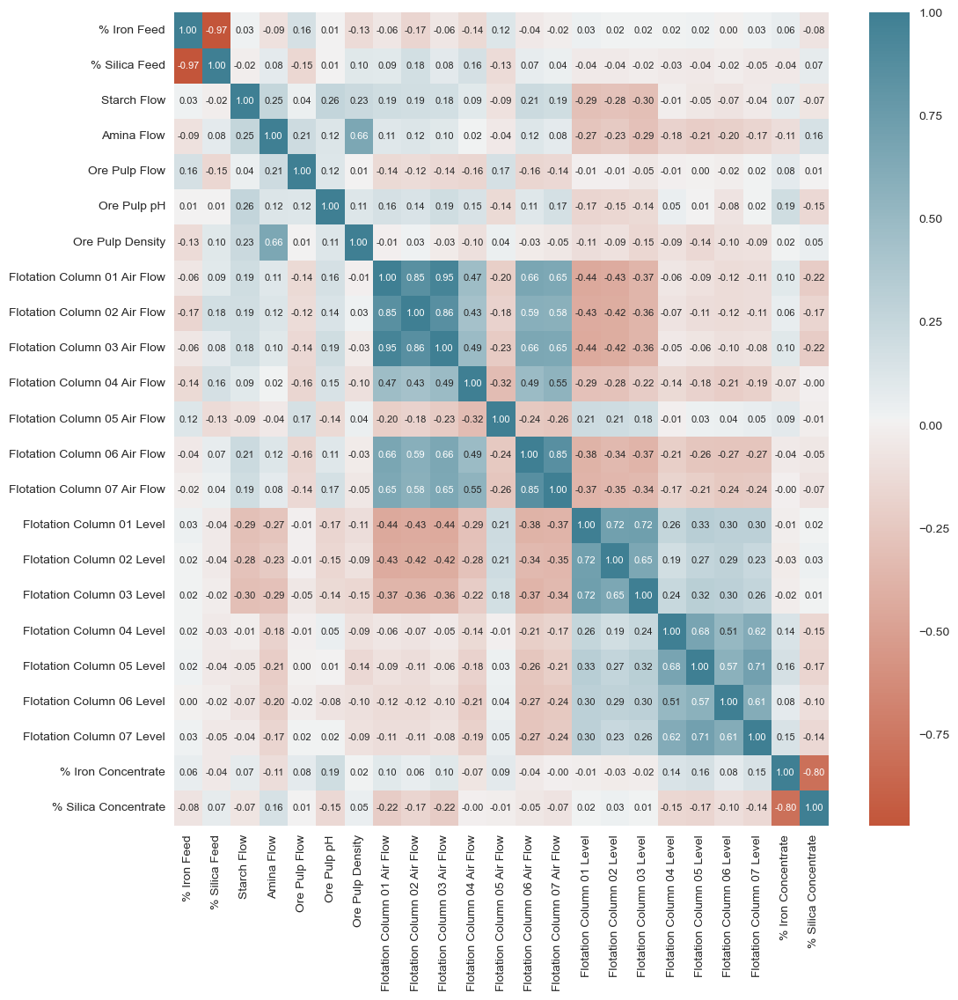

In [10]:
plt.figure(figsize=(12,12))
g = sns.heatmap(train.corr() ,
                fmt='.2f',
                annot=True, 
                annot_kws={'size': 8} ,
                cmap=sns.diverging_palette(20, 220, as_cmap=True)
            )



`plt.figure(figsize=(12,12))`: This line of code creates a new figure object using `matplotlib.pyplot.figure()`. The `figsize` parameter is set to `(12, 12)`, which means the resulting figure will have a width and height of 12 inches.

`g = sns.heatmap(train.corr(), fmt='.2f', annot=True, annot_kws={'size': 8}, cmap=sns.diverging_palette(20, 220, as_cmap=True))`: This line of code creates a heatmap plot using the `seaborn` library. Here's what each argument does:

- `train.corr()`: `train` refers to the DataFrame or data source from which you want to compute the correlation matrix. `corr()` computes the pairwise correlation of columns in `train` and returns a correlation matrix.
- `fmt='.2f'`: This specifies the format of the values displayed in the heatmap cells. `'.2f'` means the values will be displayed as floating-point numbers with two decimal places.
- `annot=True`: This adds numerical annotations to the heatmap cells. Each cell will display the corresponding correlation value.
- `annot_kws={'size': 8}`: This specifies additional keyword arguments to be passed to the `text()` function when rendering the annotations. Here, it sets the font size of the annotations to 8.
- `cmap=sns.diverging_palette(20, 220, as_cmap=True)`: This sets the color map for the heatmap. It uses the `diverging_palette()` function from `seaborn` to create a diverging color palette. The arguments `20` and `220` specify the start and end hues of the color palette, respectively.

Overall, this code generates a heatmap plot that visualizes the correlation matrix of the `train` dataset, with annotations showing the correlation values in each cell. The size of the figure is set to 12 inches by 12 inches.

In [11]:
def plotting_3_chart(df, feature):

    fig = plt.figure(constrained_layout=True, figsize=(10,5))
    grid = gridspec.GridSpec(ncols=1, nrows=3, figure=fig)

    ## Customizing the histogram grid. 
    ax1 = fig.add_subplot(grid[0, :3])
    ax1.set_title('Histogram')
    sns.distplot(df.loc[:,feature], norm_hist=True, ax = ax1)

    # customizing the QQ_plot. 
    ax2 = fig.add_subplot(grid[1, :3])
    ax2.set_title('QQ_plot')
    stats.probplot(df.loc[:,feature], plot = ax2)

    ## Customizing the Box Plot. 
    ax3 = fig.add_subplot(grid[2,:3])
    ax3.set_title('Box Plot')
    sns.boxplot(df.loc[:,feature], ax = ax3 )

The function `plotting_3_chart` takes in a pandas DataFrame `df` and a feature name `feature` as input. It creates a figure with three subplots arranged vertically.

Here's a step-by-step explanation of what the code does:

1. Creates a new figure object `fig` with constrained layout and a size of 10 inches by 5 inches.
2. Defines a grid for the subplots using `gridspec.GridSpec`, specifying 1 column and 3 rows.
3. Adds the first subplot to the figure at position `[0, :3]` in the grid. This means it spans the entire first row. Sets the title of the subplot to 'Histogram'.
4. Uses Seaborn's `distplot` function to plot a histogram of the values in the `feature` column of the DataFrame `df`. The `norm_hist=True` parameter normalizes the histogram, and the `ax=ax1` parameter specifies that the subplot `ax1` should be used for plotting.
5. Adds the second subplot to the figure at position `[1, :3]` in the grid. This means it spans the entire second row. Sets the title of the subplot to 'QQ_plot'.
6. Uses the `probplot` function from the `stats` module to plot a quantile-quantile plot (QQ plot) of the values in the `feature` column of the DataFrame `df`. The `plot=ax2` parameter specifies that the subplot `ax2` should be used for plotting.
7. Adds the third subplot to the figure at position `[2, :3]` in the grid. This means it spans the entire third row. Sets the title of the subplot to 'Box Plot'.
8. Uses Seaborn's `boxplot` function to plot a box plot of the values in the `feature` column of the DataFrame `df`. The `ax=ax3` parameter specifies that the subplot `ax3` should be used for plotting.

In summary, the `plotting_3_chart` function generates a figure with three subplots: a histogram, a QQ plot, and a box plot, all based on the values in a specific column (`feature`) of a given DataFrame (`df`).

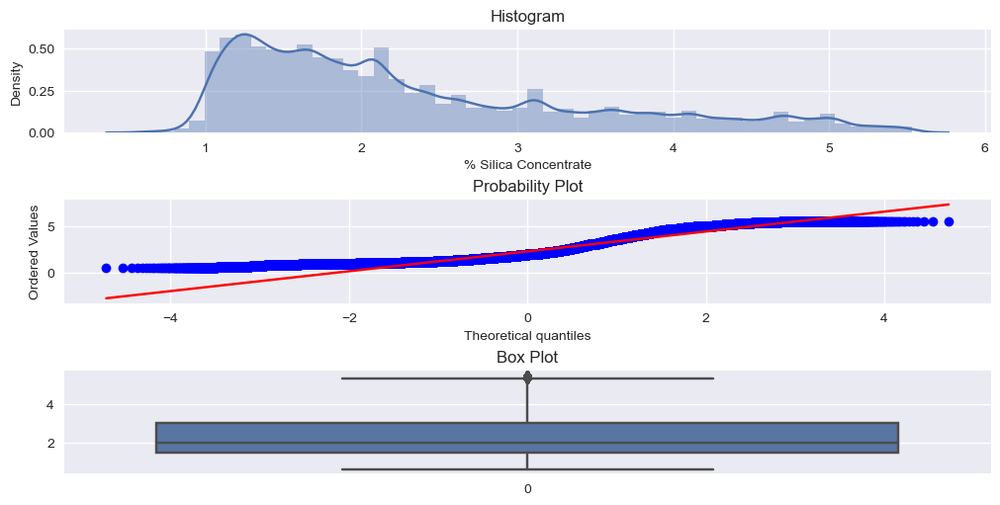

In [12]:
plotting_3_chart(train, "% Silica Concentrate")

The `plotting_3_chart` function is being called with the DataFrame `train` and the feature name `"% Silica Concentrate"` as arguments.

Assuming `train` is a pandas DataFrame containing various columns including `"% Silica Concentrate"`, the function will generate a figure with three subplots based on the given feature.

Here's a breakdown of what the code will do:

1. Creates a new figure object with a size of 10 inches by 5 inches.
2. Defines a grid for the subplots with 1 column and 3 rows.
3. Adds the first subplot (Histogram) to the figure at position `[0, :3]` in the grid.
4. Uses Seaborn's `distplot` function to plot a histogram of the values in the `"% Silica Concentrate"` column of the `train` DataFrame. The histogram will be normalized (norm_hist=True), and it will be plotted on the first subplot (ax1).
5. Adds the second subplot (QQ_plot) to the figure at position `[1, :3]` in the grid.
6. Uses the `probplot` function from the `stats` module to plot a quantile-quantile plot (QQ plot) of the values in the `"% Silica Concentrate"` column of the `train` DataFrame. The QQ plot will be plotted on the second subplot (ax2).
7. Adds the third subplot (Box Plot) to the figure at position `[2, :3]` in the grid.
8. Uses Seaborn's `boxplot` function to plot a box plot of the values in the `"% Silica Concentrate"` column of the `train` DataFrame. The box plot will be plotted on the third subplot (ax3).

In summary, the function will generate a figure with three subplots: a histogram, a QQ plot, and a box plot, all based on the values in the `"% Silica Concentrate"` column of the `train` DataFrame. Each subplot provides different visual representations of the distribution and statistical properties of the data in that column.

<Figure size 800x550 with 0 Axes>

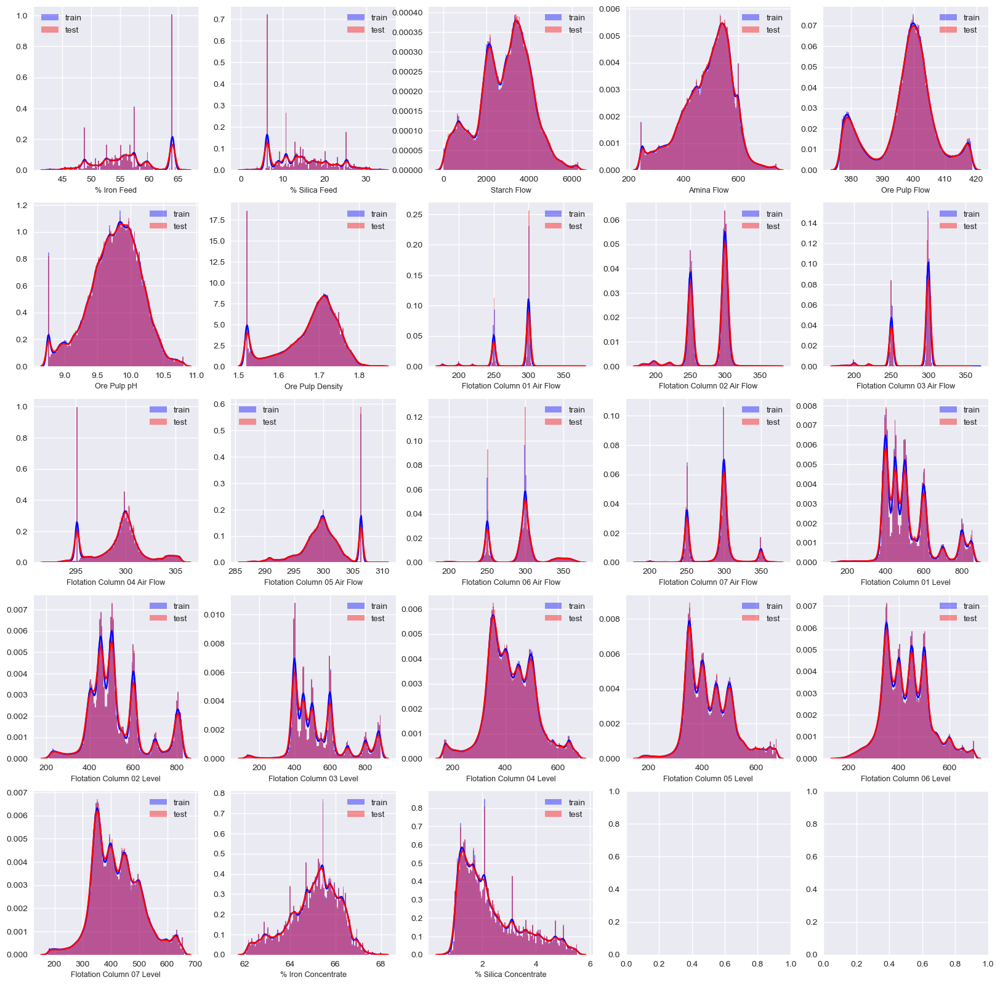

In [13]:
features = train.columns[:]
i = 1
plt.figure()
fig, ax = plt.subplots(5, 5,figsize=(20, 20))
for feature in features:
    plt.subplot(5, 5,i)
    sns.distplot(train[feature],color="blue", kde=True, bins=120, label='train')
    sns.distplot(test[feature],color="red", kde=True, bins=120, label='test')
    plt.ylabel("");plt.xlabel(feature, fontsize=9);plt.legend()
    i += 1
plt.show()

The code snippet provided generates a grid of subplots, each containing a distribution plot (histogram) for a specific feature in the `train` and `test` datasets. Let's break it down step by step:

1. It initializes the variable `features` by assigning all the column names from the `train` DataFrame to it.
2. It initializes `i` with the value 1. This variable will be used to keep track of the subplot index.
3. Creates a new figure and sets its size to 20 inches by 20 inches.
4. Calls `plt.subplots(5, 5, figsize=(20, 20))` to create a grid of subplots with 5 rows and 5 columns.
5. Enters a loop that iterates over each feature in the `features` list.
6. For each feature, it selects the `i`th subplot and activates it.
7. Uses Seaborn's `distplot` function to plot the distribution (histogram) of the values in the `train[feature]` column. The histogram is colored blue, includes a kernel density estimate (kde=True), and is divided into 120 bins. The label 'train' is added to the legend.
8. Uses Seaborn's `distplot` function again to plot the distribution of the values in the `test[feature]` column. This histogram is colored red and also includes a kernel density estimate. The label 'test' is added to the legend.
9. Sets the y-axis label of the subplot to an empty string and the x-axis label to the name of the current feature. The fontsize of the x-axis label is set to 9.
10. Adds a legend to the subplot.
11. Increments `i` by 1 to move to the next subplot.
12. Finally, calls `plt.show()` to display the figure with all the subplots.

Overall, this code snippet creates a 5x5 grid of subplots, where each subplot contains two overlapping histograms representing the distribution of a specific feature in both the `train` and `test` datasets. This visualization allows for a comparison of the feature distributions between the two datasets.

We can see that some columns are highly negatively correlated as in the case of % Iron Concentrate and % Silica Concentrate or % Iron Feed and % Silica Feed, we also see that we do not have null values and we have some abnormal values, this time I will not modify the abnormal values to be able to work with them in a next notebook where I will deal with them and I will also make assembled models to improve the results.

# Model Baseline

We will create a Baseline Model using xgboost to predict the% Silica Concentrate, so it is necessary to remove the '% Silica Concentrate', '% Iron Concentrate' columns as mentioned in the problem statement. Is it possible to predict % Silica in Concentrate whitout using % Iron Concentrate column (as they are highly correlated)?

In [14]:
X_train_split= train_split.drop(['% Silica Concentrate','% Iron Concentrate'], axis=1)
y_train_split= train_split['% Silica Concentrate']
X_valid_split= val_split.drop(['% Silica Concentrate','% Iron Concentrate'], axis=1)
y_valid_split= val_split['% Silica Concentrate']

In [15]:
model = xgb.XGBRegressor(n_estimators=3000,random_state=42, tree_method="gpu_hist").fit(
 X_train_split, y_train_split)

In [16]:
preds = model.predict(X_valid_split)
rmse = mean_squared_error(y_valid_split, preds, squared=False)
rmse

0.32183238704359296

# Week Three Report 

# Explainability

Type Markdown and LaTeX:  α2
For these first 2 examples we are going to use a subset since if we use the train it would take a long time to run, for that reason we will use SHAP later that our GPU uses to be able to work with datasets of large sizes.

In [17]:
_, val_subset = train_test_split(val_split,test_size=0.2,random_state=42)
X_valid_subset= val_subset.drop(['% Silica Concentrate','% Iron Concentrate'], axis=1)
y_valid_subset= val_subset['% Silica Concentrate']


train_test_split(val_split, test_size=0.2, random_state=42): This function is commonly used to split a dataset into training and validation sets. Here, you are splitting the "val_split" dataset into two parts, where 20% of the data will be used as the validation subset (to evaluate the model's performance) and the remaining 80% will be kept as the training data. The random_state=42 ensures that the random splitting process is reproducible.

_, val_subset: The train_test_split function returns two sets of data: the training data and the validation data. However, since you are only interested in the validation data, you use an underscore _ to indicate that you are discarding the training data and only storing the validation data in the variable val_subset.

X_valid_subset = val_subset.drop(['% Silica Concentrate', '% Iron Concentrate'], axis=1): This line creates a subset of the validation data, excluding two columns: "% Silica Concentrate" and "% Iron Concentrate." The axis parameter set to 1 means that we are dropping columns (features), not rows (samples). The remaining columns in X_valid_subset will be the input features for your model.

y_valid_subset = val_subset['% Silica Concentrate']: This line creates a separate variable y_valid_subset and assigns the column "% Silica Concentrate" from the val_subset dataset to it. This column will be your target variable, which the model will try to predict.

So, in summary, the code splits the original dataset val_split into training and validation sets, keeps only the validation subset, and separates the input features (X_valid_subset) from the target variable (y_valid_subset) for later use in model training and evaluation.

# Permutation Importance
Values towards the top are the most important features, and those towards the bottom matter least, giving us a high-level overview of the model. The first number in each row shows how much the performance of the model decreased with a random mix (in this case, using "precision" as the performance metric). this shows us the importance in terms of the column in general and how it affects the model, but has the disadvantage of taking too long when using the CPU.

In [18]:
%%time

perm = PermutationImportance(model, random_state=42).fit(X_valid_subset, y_valid_subset)
eli5.show_weights(perm, feature_names = X_valid_subset.columns.tolist())

CPU times: total: 1min 29s
Wall time: 33 s


Weight,Feature
1.2041 ± 0.0317,% Silica Feed
1.1497 ± 0.0142,% Iron Feed
0.3044 ± 0.0041,Ore Pulp pH
0.2058 ± 0.0090,Amina Flow
0.1964 ± 0.0044,Ore Pulp Density
0.1579 ± 0.0025,Flotation Column 04 Air Flow
0.1287 ± 0.0028,Flotation Column 03 Air Flow
0.1066 ± 0.0035,Flotation Column 01 Level
0.0955 ± 0.0018,Flotation Column 03 Level
0.0893 ± 0.0033,Flotation Column 01 Air Flow




1. `%%time`: This is a Jupyter Notebook magic command that measures the execution time of the following cell.

2. `perm = PermutationImportance(model, random_state=42).fit(X_valid_subset, y_valid_subset)`: Here, you create an instance of `PermutationImportance` with the given machine learning `model` and fit it with the validation subset (`X_valid_subset`) and its corresponding target variable (`y_valid_subset`). This step calculates the feature importances based on how much the model's performance changes when the features are randomly permuted.

3. `eli5.show_weights(perm, feature_names=X_valid_subset.columns.tolist())`: This line uses the `eli5.show_weights()` function from the `eli5` library to display the feature importances calculated by the `PermutationImportance` method. The `perm` object contains the importance scores for each feature, and `feature_names` is used to display the column names (feature names) from the original dataset.

Overall, this code allows you to analyze which features have the most impact on the model's predictions. The higher the feature importance score, the more significant the feature is in contributing to the model's accuracy.

# Partial Plots

Partial dependency plots show how a characteristic affects predictions. The y-axis is interpreted as a change in the prediction from what would be predicted at the baseline or the leftmost value. An area shaded in blue indicates the confidence level. We can see that Amina Flow does not affect the amount of silica in the concentrate until 380, from then on it affects the model giving a peak of affectation around 580. This gives us an idea of how a characteristic affects the result as it increases in magnitude, which to a metallurgical expert could help you better understand the process.

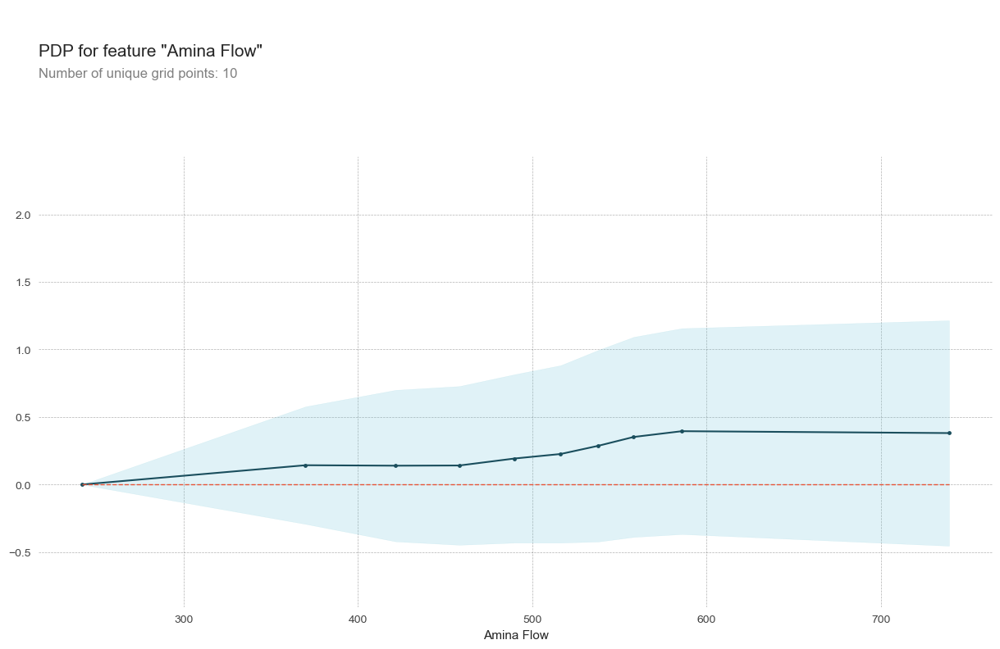

CPU times: total: 9.7 s
Wall time: 3.11 s


In [19]:
%%time

pdp_goals = pdp.pdp_isolate(model=model, 
                            dataset=X_valid_subset, 
                            model_features=X_valid_subset.columns.tolist(), 
                            feature='Amina Flow')
pdp.pdp_plot(pdp_goals, 'Amina Flow')
plt.show()



1. `%%time`: As before, this is a Jupyter Notebook magic command that measures the execution time of the following cell.

2. `pdp_goals = pdp.pdp_isolate(model=model, dataset=X_valid_subset, model_features=X_valid_subset.columns.tolist(), feature='Amina Flow')`: Here, you use the `pdp.pdp_isolate()` function to calculate the partial dependence of the target variable (the quantity you want to predict) on the 'Amina Flow' feature. The function takes the following arguments:
   - `model`: The machine learning model you want to analyze.
   - `dataset`: The dataset on which you want to calculate the partial dependence.
   - `model_features`: The list of column names (features) used by the model.
   - `feature`: The specific feature for which you want to analyze the partial dependence (in this case, it's 'Amina Flow').

3. `pdp.pdp_plot(pdp_goals, 'Amina Flow')`: After calculating the partial dependence for the 'Amina Flow' feature, you use the `pdp.pdp_plot()` function to create a visualization of the partial dependence plot. The function takes the following arguments:
   - `pdp_goals`: The result of the `pdp.pdp_isolate()` function, which contains the partial dependence values for the 'Amina Flow' feature.
   - `'Amina Flow'`: The name of the feature you want to plot. This argument is used as the label for the x-axis of the plot.

4. `plt.show()`: Finally, this command displays the created partial dependence plot using the `matplotlib.pyplot` library.

In summary, the code calculates and visualizes how changes in the 'Amina Flow' feature influence the model's predictions, which can help you understand the feature's impact on the model's behavior.

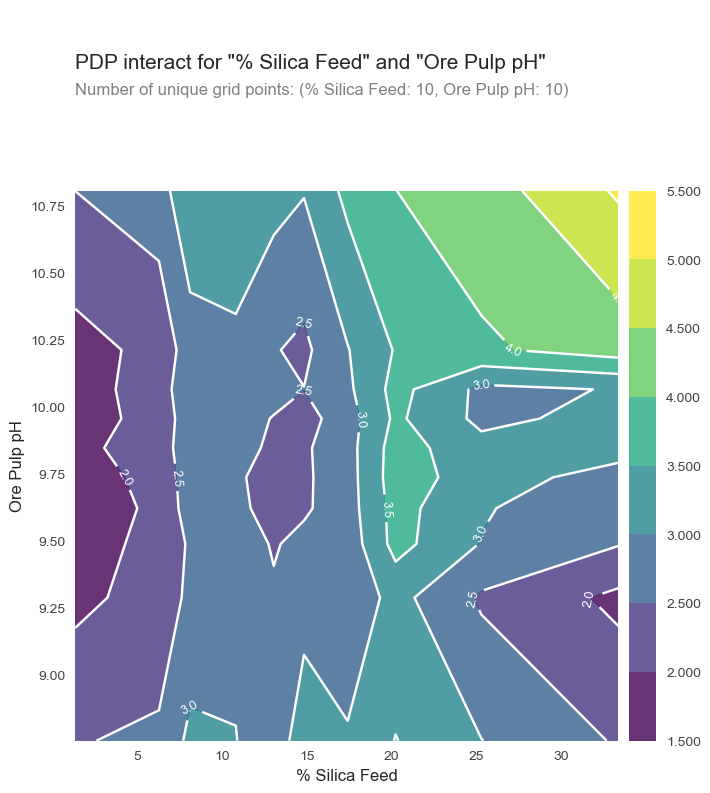

CPU times: total: 2min 12s
Wall time: 36.2 s


In [20]:
%%time

fnames = ['% Silica Feed', 'Ore Pulp pH']
longitudes_partial_plot  =  pdp.pdp_interact(model=model, dataset=X_valid_subset,
                                            model_features=X_valid_subset.columns.tolist(), features=fnames)
pdp.pdp_interact_plot(pdp_interact_out=longitudes_partial_plot,
                      feature_names=fnames, plot_type='contour')
plt.show()

In this type of graph we can see how 2 characteristics are interrelated with the target variable.



1. `%%time`: This is a Jupyter Notebook magic command that measures the execution time of the following cell.

2. `fnames = ['% Silica Feed', 'Ore Pulp pH']`: Here, you define a list called `fnames` that contains the names of the two features you want to analyze for their joint effect on the model's predictions. The two features are '% Silica Feed' and 'Ore Pulp pH'.

3. `longitudes_partial_plot = pdp.pdp_interact(model=model, dataset=X_valid_subset, model_features=X_valid_subset.columns.tolist(), features=fnames)`: Using the `pdp.pdp_interact()` function, you calculate the partial dependence values for the two features '% Silica Feed' and 'Ore Pulp pH' in combination. This step gives you an interaction plot, which shows how the model's predictions change when both features vary together. The function takes the following arguments:
   - `model`: The machine learning model you want to analyze.
   - `dataset`: The dataset on which you want to calculate the partial dependence.
   - `model_features`: The list of column names (features) used by the model.
   - `features`: The list of feature names for which you want to analyze the joint effect.

4. `pdp.pdp_interact_plot(pdp_interact_out=longitudes_partial_plot, feature_names=fnames, plot_type='contour')`: After calculating the partial dependence for the interaction between '% Silica Feed' and 'Ore Pulp pH', you use the `pdp.pdp_interact_plot()` function to create a contour plot to visualize the interaction effect. The function takes the following arguments:
   - `pdp_interact_out`: The result of the `pdp.pdp_interact()` function, which contains the partial dependence values for the interaction between the two features.
   - `feature_names`: The list of feature names you want to plot (in this case, '% Silica Feed' and 'Ore Pulp pH').
   - `plot_type`: The type of plot you want to create for the interaction. In this case, it's set to 'contour' for a contour plot.

5. `plt.show()`: Finally, this command displays the created contour plot using the `matplotlib.pyplot` library.

In summary, the code calculates and visualizes the interaction effect between the '% Silica Feed' and 'Ore Pulp pH' features on the model's predictions. The contour plot helps you understand how changes in both features together influence the model's behavior.

# SHAP

SHAP helps us better understand the model and breaks down a prediction to show the impact of each characteristic, if you want more information you can visit its website SHAP. Remember to turn on your GPU to run this part of the Notebook.

In [21]:
xgb_explainer = shap.TreeExplainer(
    model, X_train_split, feature_names=X_train_split.columns.tolist()
)

In [22]:
%%time

booster_xgb = model.get_booster()
shap_values_xgb = booster_xgb.predict(xgb.DMatrix(X_train_split, y_train_split), pred_contribs=True)

CPU times: total: 2min 35s
Wall time: 3min 3s




1. `xgb_explainer = shap.TreeExplainer(model, X_train_split, feature_names=X_train_split.columns.tolist())`: This line creates a TreeExplainer object called `xgb_explainer`. The TreeExplainer is a specific type of SHAP explainer designed for tree-based models like XGBoost.

2. `shap.TreeExplainer`: The `TreeExplainer` class from the SHAP library is used to compute SHAP values for tree-based models. SHAP values help to explain how the input features contribute to each prediction made by the model.

The function takes the following arguments:
   - `model`: The trained XGBoost model you want to explain.
   - `X_train_split`: The training data (a subset of your entire dataset) used to train the model. The TreeExplainer uses this data to understand the structure of the model.
   - `feature_names`: A list containing the names of the features in your training data. This argument ensures that SHAP can properly associate the SHAP values with the corresponding feature names when generating explanations.

After creating the TreeExplainer object, you can use it to generate SHAP values and explanations for individual predictions from your XGBoost model. SHAP values help you understand the impact of each feature on the model's predictions and provide insights into the model's decision-making process.



1. `%%time`: This is a Jupyter Notebook magic command that measures the execution time of the following cell.

2. `booster_xgb = model.get_booster()`: Here, you are obtaining the underlying booster of your XGBoost model. The booster is the internal representation of the XGBoost model, and it contains the tree ensemble structure that makes up the model.

3. `shap_values_xgb = booster_xgb.predict(xgb.DMatrix(X_train_split, y_train_split), pred_contribs=True)`: Using the obtained booster, you are calculating SHAP values for your training data. The `predict()` method of the booster is used with the `pred_contribs=True` argument to get the SHAP values (also known as feature contributions) for each prediction in the training data. This step calculates the SHAP values for all the features for each data point in `X_train_split`.

   - `xgb.DMatrix(X_train_split, y_train_split)`: The `xgb.DMatrix()` function is used to convert the training data (`X_train_split` and `y_train_split`) into a format compatible with XGBoost's internal representation.

   - `pred_contribs=True`: This argument tells the `predict()` method to return SHAP values, i.e., the contributions of each feature to the model's predictions.

After running this code, `shap_values_xgb` will contain the calculated SHAP values for each feature in the training data. You can use these SHAP values to generate individual or summary plots to visualize the impact of each feature on the model's predictions. The SHAP values help you understand which features contribute positively or negatively to a particular prediction and provide valuable insights into the model's decision-making process.

In [23]:
shap_values_xgb = shap_values_xgb[:, :-1]
pd.DataFrame(shap_values_xgb, columns=X_train_split.columns.tolist()).head()

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 05 Air Flow,Flotation Column 06 Air Flow,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level
0,0.147124,-0.115920,0.036407,0.122096,-0.013952,0.504398,0.018356,-0.260346,-0.006681,-0.098033,...,0.006016,0.008751,0.015392,0.094109,-0.007244,0.079781,0.054826,0.061494,0.122290,-0.001543
1,0.686806,0.097863,0.518346,0.261884,0.000192,0.374780,0.066780,-0.072966,0.009192,-0.101145,...,0.025091,-0.018825,-0.046293,-0.007613,-0.016968,0.047826,-0.025599,0.011007,0.022025,-0.019706
2,0.208266,-0.130053,0.058279,0.013254,-0.018526,0.003887,0.119009,-0.295034,0.047901,0.226065,...,-0.023537,0.012968,0.011018,-0.018161,0.132668,-0.032528,0.047036,-0.013531,0.133319,-0.022566
3,-0.407593,0.694870,-0.030249,-0.109676,0.167776,0.200960,0.192878,-0.051332,-0.004712,-0.099796,...,0.005442,-0.012875,-0.002889,0.076021,0.054392,0.024502,0.078566,0.024332,0.068358,0.073350
4,-0.216554,-0.303998,0.010250,-0.069772,0.012252,-0.231331,-0.140080,0.011958,-0.001633,0.199505,...,-0.054995,0.005056,0.025276,-0.054722,-0.040897,-0.051328,-0.007559,-0.096579,0.009171,-0.002562



1. `shap_values_xgb = shap_values_xgb[:, :-1]`: Here, you are slicing the `shap_values_xgb` array to exclude the last column. The last column of the `shap_values_xgb` array typically represents the bias term (constant term) used in the model, which does not provide meaningful SHAP values for individual features. By excluding it, you ensure that the DataFrame contains only the SHAP values for each feature.

2. `pd.DataFrame(shap_values_xgb, columns=X_train_split.columns.tolist())`: This line creates a pandas DataFrame from the modified `shap_values_xgb` array. The DataFrame will have the SHAP values for each feature as its columns. The `columns` argument is set to `X_train_split.columns.tolist()`, which provides the column names (feature names) for the DataFrame based on the original training data (`X_train_split`).

3. `.head()`: The `head()` method is used to display the first few rows of the DataFrame, providing a quick look at the SHAP values for the initial data points.

The resulting DataFrame will have the SHAP values for each feature as columns, with each row corresponding to a data point in your training data (`X_train_split`). The DataFrame allows you to inspect the SHAP values for each feature, helping you understand how individual features contribute to each prediction made by your XGBoost model.

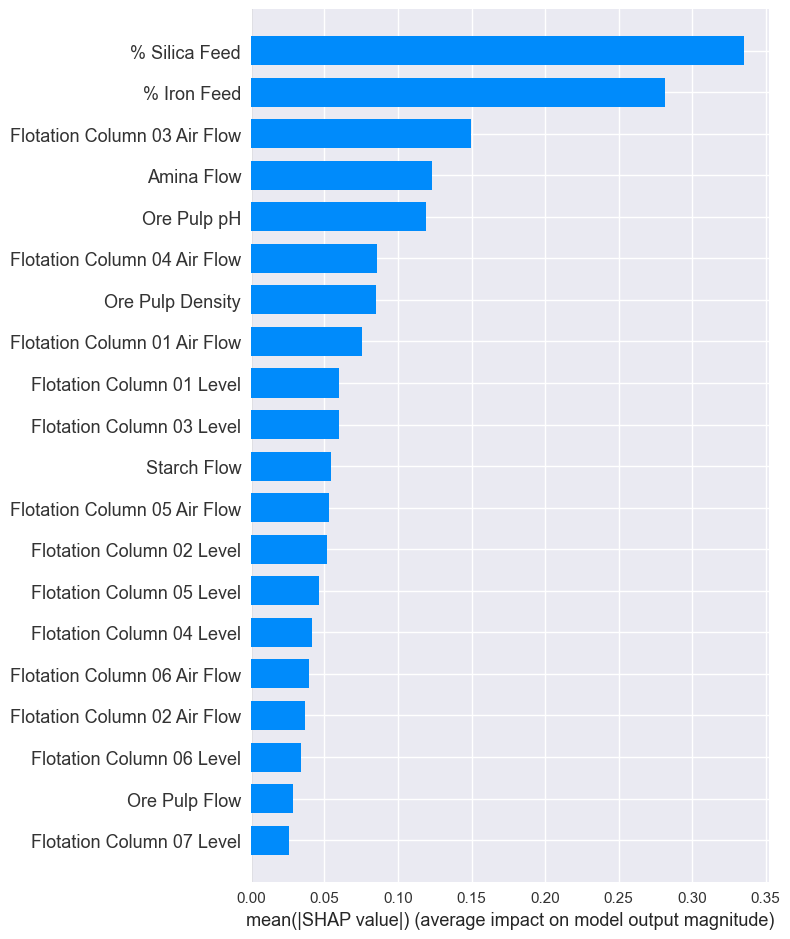

In [24]:
shap.summary_plot(
    shap_values_xgb, X_train_split, feature_names=X_train_split.columns, plot_type="bar"
)



1. `shap.summary_plot(shap_values_xgb, X_train_split, feature_names=X_train_split.columns, plot_type="bar")`: This line generates the summary plot using the `shap.summary_plot()` function.

   - `shap_values_xgb`: The SHAP values obtained previously for your XGBoost model's predictions on the training data. These values represent the impact of each feature on the model's predictions.
   - `X_train_split`: The original training data (pandas DataFrame) used to train the model. The `shap.summary_plot()` function uses this data to align the SHAP values with the corresponding features.
   - `feature_names`: The names of the features in the training data. This argument ensures that the summary plot displays meaningful labels for each feature.
   - `plot_type="bar"`: The `plot_type` parameter is set to "bar" to create a bar chart for the summary plot. This means each feature will be represented by a vertical bar, and the length of the bar will show the magnitude of its impact (SHAP value) on the model's predictions.

The summary plot will display the features on the x-axis and their corresponding SHAP values on the y-axis. Positive SHAP values indicate that the feature has a positive impact on the model's predictions, while negative values indicate a negative impact. The length of each bar represents the magnitude of the impact.

This plot is useful for understanding which features are most influential in your model's predictions and can help you identify which features have the most significant impact on the target variable.

This graph indicates that the values towards the top are the most important characteristics, and those towards the bottom are the ones that matter the least, giving us a high-level general description of the model, so more care should be taken in the plant in these important characteristics, paying more attention to Flotation Column 03 Air Flow, we should also take care that the process of Ore Pulp pH and Amina Flow are correct since they greatly affect our objective.

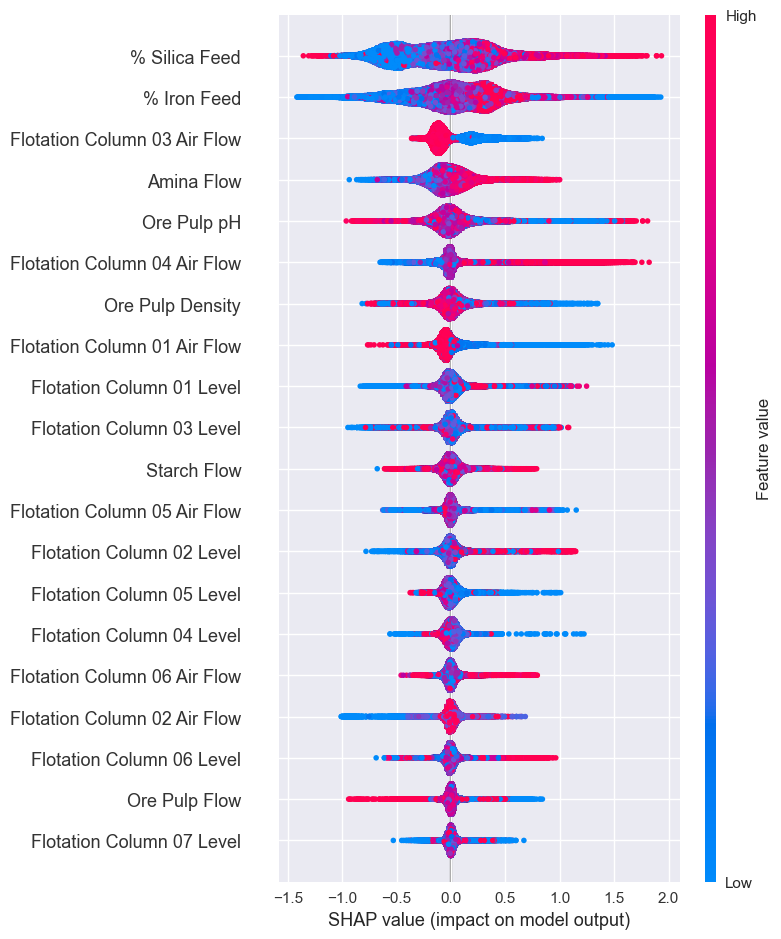

In [25]:
shap.summary_plot(shap_values_xgb, X_train_split, feature_names=X_train_split.columns);

The code you provided generates a summary plot using the SHAP library to visualize the overall impact of each feature on your XGBoost model's predictions. The `shap.summary_plot()` function will display the plot directly without the need for additional commands to show the plot in Jupyter Notebook.

Here's a brief summary of the function parameters used in the code:

1. `shap_values_xgb`: The SHAP values obtained previously for your XGBoost model's predictions on the training data. These values represent the impact of each feature on the model's predictions.

2. `X_train_split`: The original training data (pandas DataFrame) used to train the model. The `shap.summary_plot()` function uses this data to align the SHAP values with the corresponding features.

3. `feature_names`: The names of the features in the training data. This argument ensures that the summary plot displays meaningful labels for each feature.

When you run this code, the summary plot will be displayed directly in your Jupyter Notebook, showing the features on the x-axis and their corresponding SHAP values on the y-axis. Positive SHAP values indicate that the feature has a positive impact on the model's predictions, while negative values indicate a negative impact. The length and color of each bar represent the magnitude and direction of the impact.

The summary plot is a valuable tool for gaining insights into your model's behavior and understanding the most critical features that influence its predictions.

-The vertical axis on the left indicates the names of the features, arranged according to their importance, from top to bottom. /-The horizontal axis represents the magnitude of the SHAP values for the predictions. /-The right vertical axis represents the actual magnitude of a feature as it appears in the data set and colors the points. From the graph of% Silica Feed, as we see in the graph that the more value this characteristic has, the more it impacts the SAHP value, therefore it affects the model more, which makes sense. From the graph of Flotation Column 03 Air Flow, from this graph we can see that while the values are higher the shap value decreases and while the value is lower the shap value increases. If we keep observing we can draw more conclusions. A good understanding of these graphs is important to understand the model.

# Week Four Report

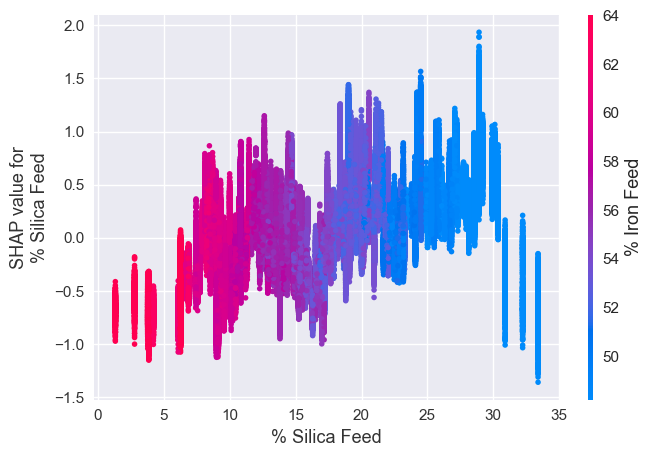

In [26]:
shap.dependence_plot("% Silica Feed", shap_values_xgb, X_train_split, interaction_index="% Iron Feed");

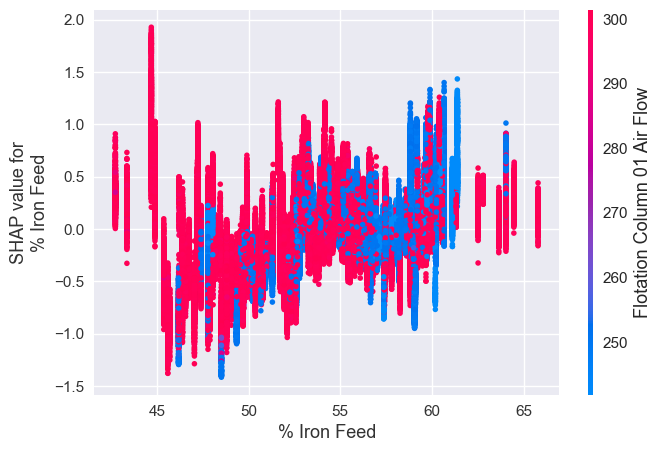

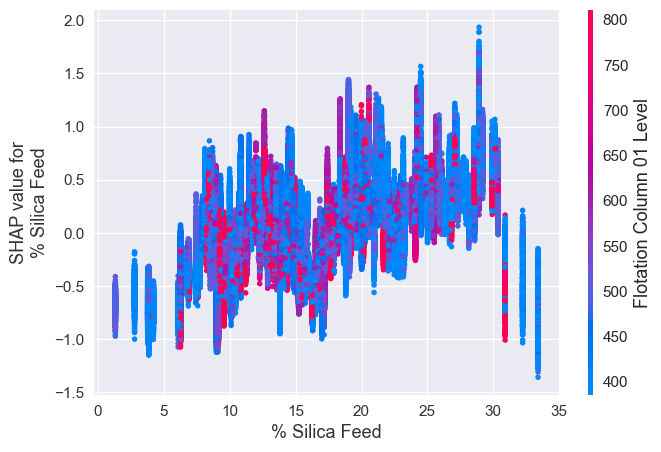

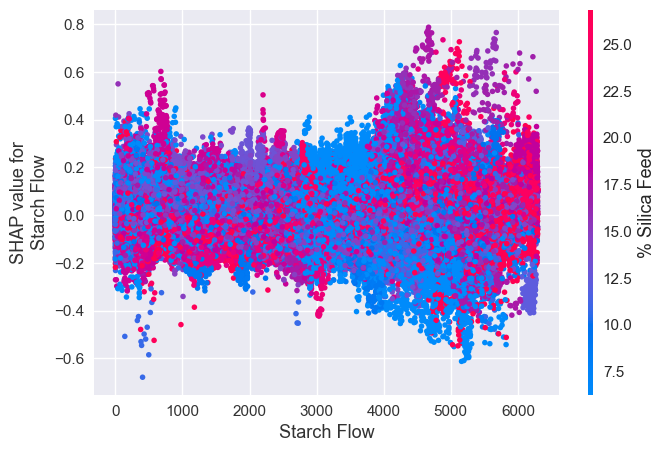

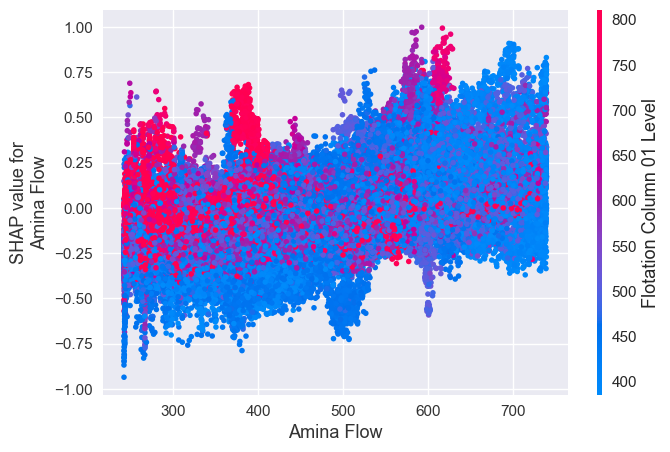

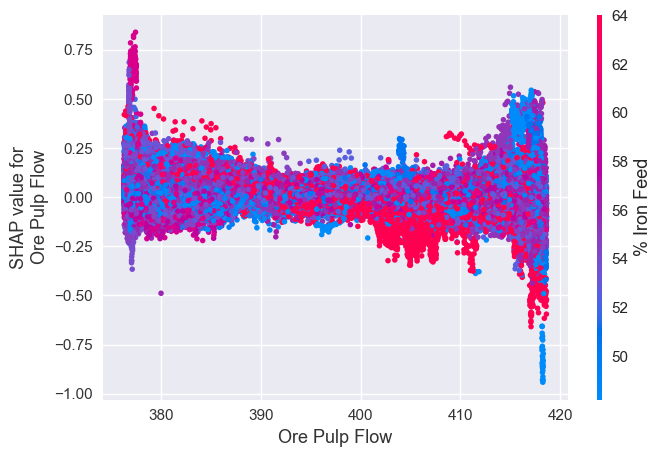

...

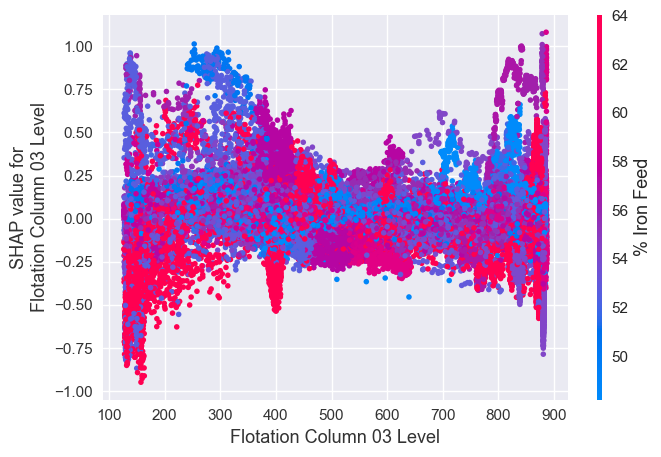

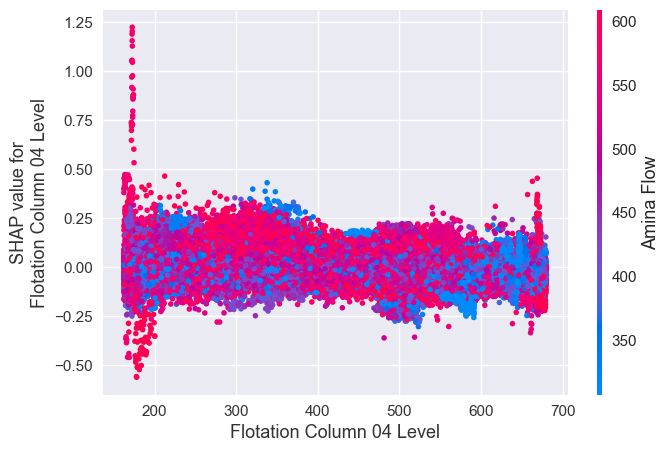

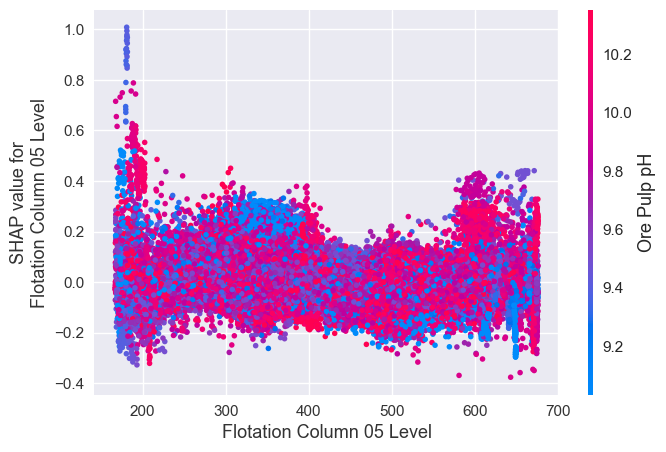

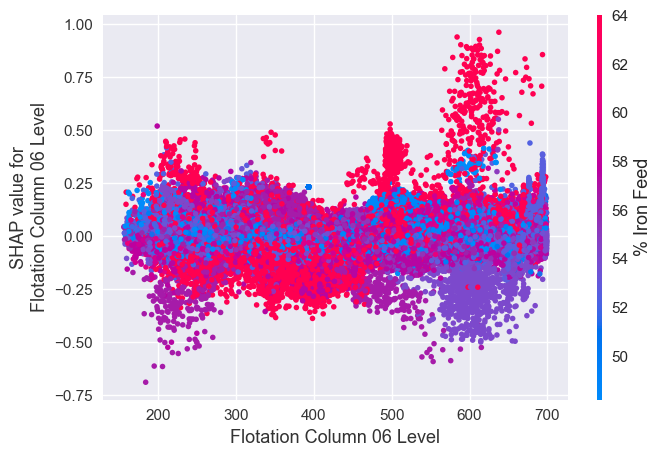

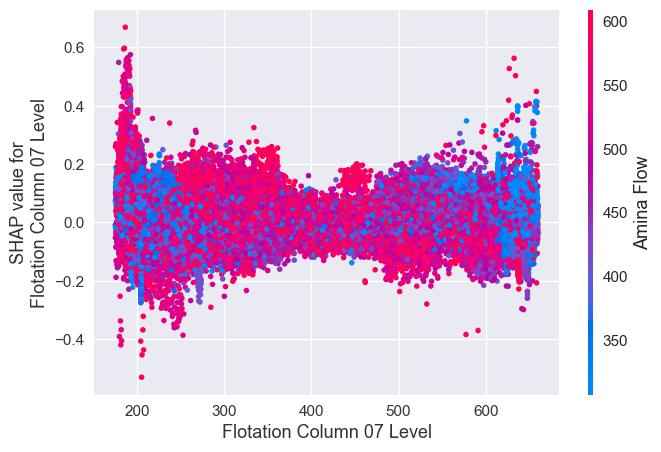

In [27]:
target_plot = [col for col in train.columns.to_list() if col not in ["date",'% Silica Concentrate','% Iron Concentrate']]

for target in target_plot:
    shap.dependence_plot(target, shap_values_xgb, X_train_split, interaction_index="auto");

In [28]:
%%time

interactions_xgb = booster_xgb.predict(
    xgb.DMatrix(X_train_split, y_train_split), pred_interactions=True
)

CPU times: total: 24min 28s
Wall time: 29min 59s


In [29]:
def get_top_k_interactions(feature_names, shap_interactions, k):
    # Get the mean absolute contribution for each feature interaction
    aggregate_interactions = np.mean(np.abs(shap_interactions[:, :-1, :-1]), axis=0)
    interactions = []
    for i in range(aggregate_interactions.shape[0]):
        for j in range(aggregate_interactions.shape[1]):
            if j < i:
                interactions.append(
                    (
                        feature_names[i] + "-" + feature_names[j],
                        aggregate_interactions[i][j] * 2,
                    )
                )
    # sort by magnitude
    interactions.sort(key=lambda x: x[1], reverse=True)
    interaction_features, interaction_values = map(tuple, zip(*interactions))

    return interaction_features[:k], interaction_values[:k]


top_10_inter_feats, top_10_inter_vals = get_top_k_interactions(
    X_train_split.columns, interactions_xgb, 10
)


def plot_interaction_pairs(pairs, values):
    plt.bar(pairs, values)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show();

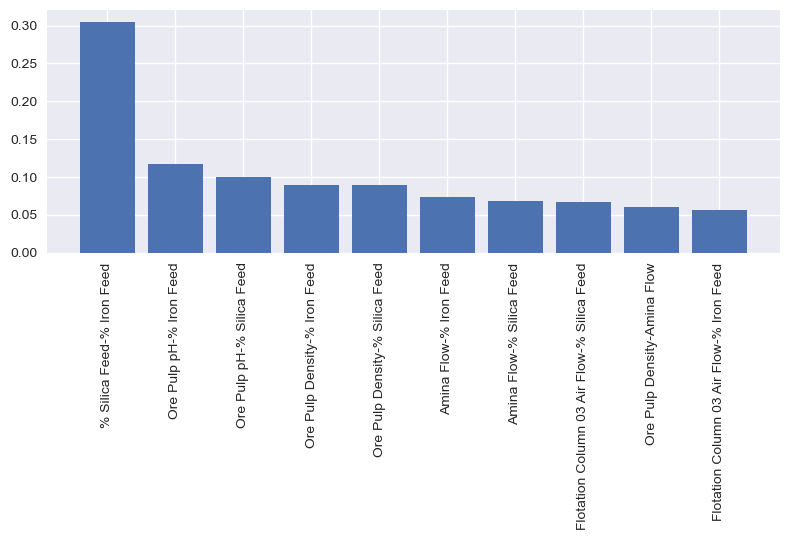

In [30]:
top_10_inter_feats, top_10_inter_vals = get_top_k_interactions(
    X_train_split.columns, interactions_xgb, 10
)

plot_interaction_pairs(top_10_inter_feats, top_10_inter_vals)

# Local interpretability

Local interpretability helps us understand an individual prediction of the model, showing how each characteristic affects the prediction. That is, the SHAP values of all the features are added together to explain why my prediction was different from the baseline (the mean). This allows us to decompose a prediction into a graph that shows which characteristics contribute positively, which characteristics contribute negatively, and how much those characteristics mattered. In the case of a metallurgical plant, it will help us understand why the% Silica Concentrate varied at a certain time and what this variation was due to, so that the engineers pay attention to these points.

In [31]:
row_to_show = 5
data_for_prediction = X_train_split.iloc[row_to_show]
shap_values = xgb_explainer.shap_values(data_for_prediction)

In [32]:
shap.initjs()
shap.force_plot(xgb_explainer.expected_value, shap_values, data_for_prediction)

In [33]:
row_to_show = 200
data_for_prediction = X_train_split.iloc[row_to_show]
shap_values = xgb_explainer.shap_values(data_for_prediction)

In [34]:
shap.initjs()
shap.force_plot(xgb_explainer.expected_value, shap_values, data_for_prediction)

# Hyperparameter Optimization

Now we are going to optimize the hyperparameters to improve the XGBoost model, for this we are going to use the optuna tool that helps us find the best hyperparameters.

In [35]:
columns = [col for col in train.columns.to_list() if col not in ["date",'% Silica Concentrate','% Iron Concentrate']]


In [36]:
data=train[columns]
target=train['% Silica Concentrate']
data

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 05 Air Flow,Flotation Column 06 Air Flow,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level
122767,50.22,23.80,1030.730500,538.545000,399.459000,9.574020,1.728150,249.716,244.965,251.373,...,299.662371,250.049,249.936,618.71200,624.960000,587.206000,492.420000,434.16500,483.134000,569.042000
151410,58.05,11.85,2210.340000,473.633000,394.629000,9.363180,1.750520,300.146,299.487,301.904,...,300.366000,290.918,300.806,510.49800,489.375000,500.703000,401.172000,351.39800,396.521000,429.268000
52787,50.92,21.67,2072.900000,497.836000,400.112000,9.429890,1.728090,248.364,242.783,250.711,...,306.400000,244.771,248.803,799.14800,809.827829,798.148000,454.537400,416.24200,432.391000,404.617000
514727,45.60,29.92,2262.017786,355.899343,407.645216,10.769500,1.719867,300.328,297.799,296.994,...,302.098000,299.441,297.477,824.34173,820.838171,863.093267,645.886598,588.28978,653.636269,633.378949
664563,65.78,1.31,3750.190000,471.097000,388.235000,9.530740,1.721840,300.403,300.438,298.608,...,299.231000,296.357,307.712,478.66500,519.676000,467.834000,508.730000,498.52000,322.831000,482.329000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259178,64.03,6.26,3392.500000,485.835000,397.630000,10.139300,1.667260,298.552,297.821,301.396,...,302.418000,299.191,299.211,452.24200,434.232000,437.562000,400.200000,362.97000,367.271000,406.046000
365838,64.48,3.85,676.264000,565.488000,395.330000,9.652550,1.684740,300.267,297.648,299.791,...,302.348000,299.068,297.859,398.02200,339.306000,402.850000,397.934000,409.37200,410.725000,424.524000
131932,55.17,14.35,1001.368837,423.757000,399.142000,9.711390,1.577880,250.235,247.996,250.606,...,302.085690,250.136,248.111,623.41400,588.404000,592.362000,350.939000,329.64700,328.891000,300.156000
671155,58.26,12.88,3218.910000,529.337000,380.179400,8.753917,1.712730,299.707,298.627,301.695,...,302.741000,300.626,300.340,498.88400,519.900000,553.157000,476.097000,447.63900,482.616000,442.915000


In [37]:
def objective(trial,data=data,target=target):
    
    train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.15,random_state=42)

    param = {
        'max_depth': trial.suggest_int('max_depth', 2, 15),
        'subsample': trial.suggest_discrete_uniform('subsample', 0.6, 1.0, 0.05),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1500, 50),
        'eta': trial.suggest_discrete_uniform('eta', 0.01, 0.1, 0.01),
        'reg_alpha': trial.suggest_int('reg_alpha', 1, 50),
        'reg_lambda': trial.suggest_int('reg_lambda', 5, 100),
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 20),
#         'learning_rate': trial.suggest_discrete_uniform('leaning_rate', 0.01, 1, 0.01)
    }
    
    model = xgb.XGBRegressor(tree_method="gpu_hist",**param )  
    
    model.fit(train_x,train_y,eval_set=[(test_x,test_y)],early_stopping_rounds=100,verbose=False)
    
    preds = model.predict(test_x)
    
    rmse = mean_squared_error(test_y, preds,squared=False)
    
    return rmse

In [38]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=30)
#study.optimize(objective, n_trials=50)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2023-08-15 12:31:01,150] A new study created in memory with name: no-name-dd11b120-9ecd-4f9b-b614-747c5525433c
[I 2023-08-15 12:31:05,838] Trial 0 finished with value: 0.7325556382236602 and parameters: {'max_depth': 4, 'subsample': 1.0, 'n_estimators': 550, 'eta': 0.060000000000000005, 'reg_alpha': 13, 'reg_lambda': 14, 'min_child_weight': 12}. Best is trial 0 with value: 0.7325556382236602.
[I 2023-08-15 12:31:41,267] Trial 1 finished with value: 0.3216394672562692 and parameters: {'max_depth': 13, 'subsample': 0.8, 'n_estimators': 400, 'eta': 0.060000000000000005, 'reg_alpha': 8, 'reg_lambda': 50, 'min_child_weight': 7}. Best is trial 1 with value: 0.3216394672562692.
[I 2023-08-15 12:31:47,531] Trial 2 finished with value: 0.8726273430122464 and parameters: {'max_depth': 4, 'subsample': 0.6, 'n_estimators': 800, 'eta': 0.01, 'reg_alpha': 46, 'reg_lambda': 41, 'min_child_weight': 15}. Best is trial 1 with value: 0.3216394672562692.
[I 2023-08-15 12:31:51,202] Trial 3 finished wit

[I 2023-08-15 12:53:07,462] Trial 29 finished with value: 0.27988038503543833 and parameters: {'max_depth': 12, 'subsample': 1.0, 'n_estimators': 1400, 'eta': 0.06999999999999999, 'reg_alpha': 16, 'reg_lambda': 68, 'min_child_weight': 12}. Best is trial 29 with value: 0.27988038503543833.


Number of finished trials: 30
Best trial: {'max_depth': 12, 'subsample': 1.0, 'n_estimators': 1400, 'eta': 0.06999999999999999, 'reg_alpha': 16, 'reg_lambda': 68, 'min_child_weight': 12}


In [39]:
study.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_eta,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample,state
0,0,0.732556,2023-08-15 12:31:01.150685,2023-08-15 12:31:05.838559,0 days 00:00:04.687874,0.06,4,12,550,13,14,1.00,COMPLETE
1,1,0.321639,2023-08-15 12:31:05.838559,2023-08-15 12:31:41.267246,0 days 00:00:35.428687,0.06,13,7,400,8,50,0.80,COMPLETE
2,2,0.872627,2023-08-15 12:31:41.267246,2023-08-15 12:31:47.531711,0 days 00:00:06.264465,0.01,4,15,800,46,41,0.60,COMPLETE
3,3,0.734764,2023-08-15 12:31:47.531711,2023-08-15 12:31:51.202146,0 days 00:00:03.670435,0.08,4,20,400,11,23,0.75,COMPLETE
4,4,0.763512,2023-08-15 12:31:51.203147,2023-08-15 12:31:53.556067,0 days 00:00:02.352920,0.06,5,19,200,7,15,1.00,COMPLETE
5,5,0.304768,2023-08-15 12:31:53.556067,2023-08-15 12:32:58.681078,0 days 00:01:05.125011,0.05,13,7,1000,21,71,0.90,COMPLETE
6,6,0.710686,2023-08-15 12:32:58.694967,2023-08-15 12:33:11.157385,0 days 00:00:12.462418,0.01,6,4,1150,12,46,0.80,COMPLETE
7,7,0.456031,2023-08-15 12:33:11.157385,2023-08-15 12:33:27.791832,0 days 00:00:16.634447,0.06,7,18,1200,43,67,0.75,COMPLETE
8,8,0.379336,2023-08-15 12:33:27.791832,2023-08-15 12:34:03.916120,0 days 00:00:36.124288,0.03,12,17,600,4,73,0.70,COMPLETE
9,9,0.514971,2023-08-15 12:34:03.916120,2023-08-15 12:34:11.446142,0 days 00:00:07.530022,0.07,7,3,500,13,63,0.95,COMPLETE


In [40]:
optuna.visualization.plot_optimization_history(study)

In [41]:
optuna.visualization.plot_parallel_coordinate(study)

In [42]:
optuna.visualization.plot_slice(study)

In [43]:
#plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
optuna.visualization.plot_contour(study, params=['max_depth',
                            #'max_depth',
                            'eta',
                            'subsample',
                            "n_estimators",
                            'min_child_weight',
                            'subsample',
                                                "reg_alpha",'reg_lambda'
                                                ])

In [44]:
#Visualize parameter importances.
optuna.visualization.plot_param_importances(study)

In [45]:
#Visualize empirical distribution function
optuna.visualization.plot_edf(study)

# Model Testing

For this case I am going to put the values that optuna gave me with a n_trials = 50, this value can be improved by fine-tuning the optuna parameters looking for a better result.

In [46]:
params={'max_depth': 12, 'subsample': 0.9, 'n_estimators': 4450, 'eta': 0.04, 'reg_alpha': 2, 'reg_lambda': 33, 'min_child_weight': 19}
model = xgb.XGBRegressor(**params, tree_method="gpu_hist",random_state=42).fit(
   X_train_split, y_train_split
)

In [47]:
preds = model.predict(X_valid_split)
rmse = mean_squared_error(y_valid_split, preds, squared=False)
rmse

0.24935912700434532

# Cross-Validation

In [48]:
preds = np.zeros(test.shape[0])
kf = KFold(n_splits=5,random_state=42,shuffle=True)
rmse=[]  # list contains rmse for each fold
n=0
for trn_idx, test_idx in kf.split(train[columns],train['% Silica Concentrate']):
    X_tr,X_val=train[columns].iloc[trn_idx],train[columns].iloc[test_idx]
    y_tr,y_val=train['% Silica Concentrate'].iloc[trn_idx],train['% Silica Concentrate'].iloc[test_idx]
    model = xgb.XGBRegressor(**params, tree_method="gpu_hist",random_state=42)
    model.fit(X_tr,y_tr,eval_set=[(X_val,y_val)],early_stopping_rounds=100,verbose=False)
    preds+=model.predict(test[columns])/kf.n_splits
    rmse.append(mean_squared_error(y_val, model.predict(X_val), squared=False))
    print(n+1,rmse[n])
    n+=1

1 0.2504430302399356
2 0.2489193833995328
3 0.24793790836281374
4 0.24574641832440983
5 0.24637815643209604


In [49]:
np.mean(rmse)

0.2478849793517576

In [50]:
# Compute rmse_test
rmse_test = mean_squared_error(test['% Silica Concentrate'], preds)**0.5

# Print rmse_test
print('Test score: {:.3f}'.format(rmse_test))

Test score: 0.236


# Summary

In this notebook we have seen how to use SHAP and Optuna to understand and improve our Machine Learning models, in the following weeks I will upload another post where I will work on outliers, optimize and tune the hyperparameters of different models and use an assembled model to reduce the RMSE.